# Earthlab UAV Air Quality Project LiDAR Data Analysis and Visualization
David Shean  
December 12, 2021

Requires self-consistent tif products from processing notebook

In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import rioxarray
import xrspatial
from matplotlib_scalebar.scalebar import ScaleBar
import contextily as cx

In [2]:
import hvplot.xarray

In [3]:
plt.rcParams['savefig.facecolor']='white'

In [4]:
def hide_ticks(ax):
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

In [5]:
#site_name = 'Saltwater St Pk'
#site_name = 'Southern Heights Park'
#site_name = 'Jefferson Park - Ecology AQ site'
#site_name = 'Magnuson Park'
#site_name = 'Judkins Park'

In [7]:
#xds.spatial_ref
#lidar_crs = xds.spatial_ref.crs_wkt
lidar_crs = 'EPSG:6597'
unit = 'US ft'

In [8]:
stat = 'idw'

In [9]:
pdal_stats = ('min', 'max', 'mean', 'idw', 'count', 'stdev')

In [10]:
stat_idx = pdal_stats.index(stat)

In [11]:
dsm_pdal_fn = os.path.join(site_name, 'dsm_pdal_all.tif')
dtm_pdal_fn = os.path.join(site_name, 'dtm_pdal_all.tif')
irg_pdal_fn = os.path.join(site_name, 'irg_pdal_all.tif')

In [36]:
dsm_pdal_fn = os.path.join(site_name, 'dsm_pdal.tif')
dtm_pdal_fn = os.path.join(site_name, 'dtm_pdal.tif')
#dsm_3DEP_fn = os.path.join(site_name, 'dsm_3DEP.tif')
dsm_3DEP_fn = os.path.join(site_name, 'dsm_3DEP.vrt')
#dtm_3DEP_fn = os.path.join(site_name, 'dtm_3DEP.tif')
dtm_3DEP_fn = os.path.join(site_name, 'dtm_3DEP.vrt')
irg_pdal_fn = os.path.join(site_name, 'irg_pdal.tif')

In [37]:
fn_list = [dsm_pdal_fn, dtm_pdal_fn, dsm_3DEP_fn, dtm_3DEP_fn]
names = ['DSM_PDAL', 'DTM_PDAL', 'DSM_3DEP', 'DTM_3DEP']

In [38]:
gdal_opt = '-co TILED=YES -co COMPRESS=LZW -co BIGTIFF=IF_SAFER'

In [39]:
fn_hs_list = []
for fn in fn_list:
    fn_hs = os.path.splitext(fn)[0]+'_hs.tif'
    if 'all' in fn:
        b = stat_idx
    else:
        b = 1
    !gdaldem hillshade $gdal_opt -b $b -multidirectional "$fn" "$fn_hs"
    fn_hs_list.append(fn_hs)

0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0Warning 1: USGS_OPR_WA_KingCounty_2021_B21_be_King_2211.tif: This file used to have optimizations in its layout, but those have been, at least partly, invalidated by later changes
...10...20...30...40...50...60...70...80...90...100 - done.


In [40]:
fn_list.extend(fn_hs_list)
fn_list.append(irg_pdal_fn)

In [41]:
names.extend([name+'_hs' for name in names])
names.append('Intensity')

In [42]:
fn_list

['Judkins Park/dsm_pdal.tif',
 'Judkins Park/dtm_pdal.tif',
 'Judkins Park/dsm_3DEP.vrt',
 'Judkins Park/dtm_3DEP.vrt',
 'Judkins Park/dsm_pdal_hs.tif',
 'Judkins Park/dtm_pdal_hs.tif',
 'Judkins Park/dsm_3DEP_hs.tif',
 'Judkins Park/dtm_3DEP_hs.tif',
 'Judkins Park/irg_pdal.tif']

In [43]:
names

['DSM_PDAL',
 'DTM_PDAL',
 'DSM_3DEP',
 'DTM_3DEP',
 'DSM_PDAL_hs',
 'DTM_PDAL_hs',
 'DSM_3DEP_hs',
 'DTM_3DEP_hs',
 'Intensity']

In [44]:
xds_list = []
for i, fn in enumerate(fn_list):
    temp = rioxarray.open_rasterio(fn, mask_and_scale=True).squeeze()
    temp.name = names[i]
    xds_list.append(temp)

In [46]:
#xds = xr.merge(xds_list)
#For single-band tif
xds = xr.merge(xds_list).drop('band')

In [47]:
xds

<xarray.Dataset>
Dimensions:      (x: 668, y: 668)
Coordinates:
  * x            (x) float64 1.277e+06 1.277e+06 ... 1.278e+06 1.278e+06
  * y            (y) float64 2.196e+05 2.196e+05 ... 2.186e+05 2.186e+05
    spatial_ref  int64 0
Data variables:
    DSM_PDAL     (y, x) float32 ...
    DTM_PDAL     (y, x) float32 ...
    DSM_3DEP     (y, x) float32 ...
    DTM_3DEP     (y, x) float32 ...
    DSM_PDAL_hs  (y, x) float32 ...
    DTM_PDAL_hs  (y, x) float32 ...
    DSM_3DEP_hs  (y, x) float32 ...
    DTM_3DEP_hs  (y, x) float32 ...
    Intensity    (y, x) float32 ...
Attributes:
    long_name:  idw
    units:      US survey foot

In [48]:
#Normalize intensity
#Should actually calculate scale and offset
xds['Intensity'] /= xds['Intensity'].max()

In [49]:
xds['CHM_PDAL'] = xds['DSM_PDAL'] - xds['DTM_PDAL']
xds['CHM_3DEP'] = xds['DSM_3DEP'] - xds['DTM_3DEP']

Warning 1: USGS_OPR_WA_KingCounty_2021_B21_be_King_2211.tif: This file used to have optimizations in its layout, but those have been, at least partly, invalidated by later changes


## Compute center point

In [50]:
xds.attrs['xc'] = xds['x'].mean().values
xds.attrs['yc'] = xds['y'].mean().values

In [51]:
#Note the order of x and y is flipped, otherwise need transpose when plotting
xds.coords['r'] = np.sqrt((xds['y']-xds.attrs['yc'])**2 + \
                              (xds['x']-xds.attrs['xc'])**2)

In [52]:
xds.coords['az'] = (np.degrees(-np.arctan2((xds['y']-xds.attrs['yc']), (xds['x']-xds.attrs['xc'])) + np.pi/2) + 360) % 360
#xds.coords['az'] = (np.degrees(-np.arctan2((xds.attrs['xc'] - xds['x']), (xds.attrs['yc'] - xds['y'])) - np.pi/2) + 360) % 360

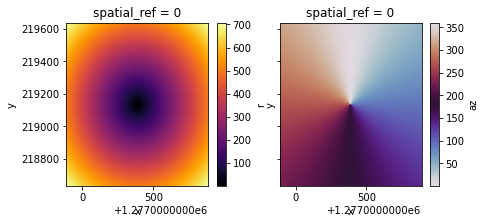

In [53]:
f, axa = plt.subplots(1,2,figsize=(7,3), sharex=True, sharey=True)
xds.coords['r'].plot(ax=axa[0], cmap='inferno')
xds.coords['az'].plot(ax=axa[1], cmap='twilight')

In [54]:
#xds.attrs['long_name'] = None

In [56]:
#For 6-band analysis
#(xds.DSM_PDAL - xds.DSM_3DEP).median(dim=['x','y'])
#(xds.DTM_PDAL - xds.DTM_3DEP).median(dim=['x','y'])

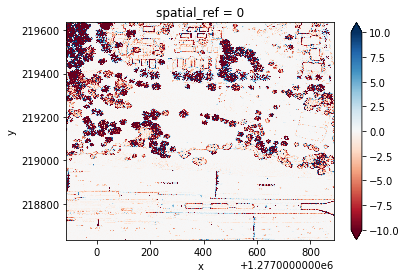

In [57]:
(xds.DSM_PDAL - xds.DSM_3DEP).plot(cmap='RdBu', vmin=-10, vmax=10)

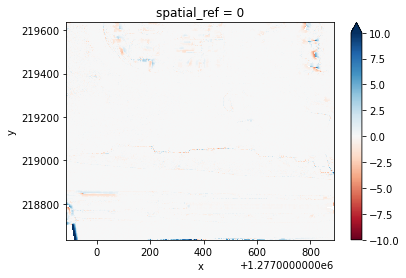

In [58]:
(xds.DTM_PDAL - xds.DTM_3DEP).plot(cmap='RdBu', vmin=-10, vmax=10)

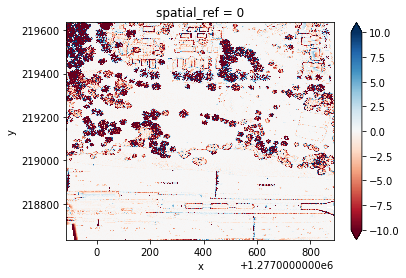

In [59]:
(xds.CHM_PDAL - xds.CHM_3DEP).plot(cmap='RdBu', vmin=-10, vmax=10)

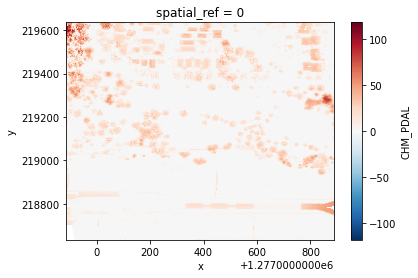

In [60]:
xds.CHM_PDAL.plot()

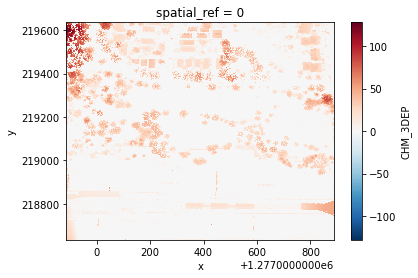

In [61]:
xds.CHM_3DEP.plot()

In [62]:
dsm_clim = (xds.DTM_3DEP.quantile(0.05), xds.DSM_3DEP.quantile(0.95))
hs_clim = xds.DSM_3DEP_hs.quantile((0.02, 0.98)).values

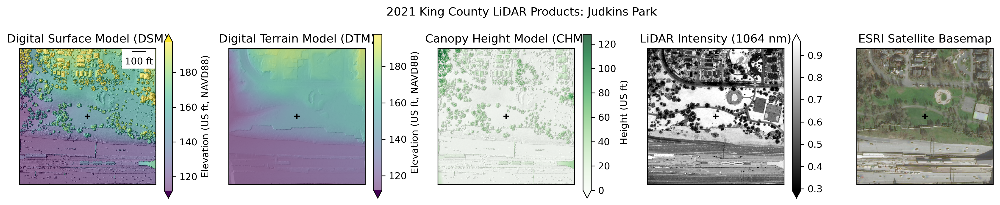

In [64]:
fig_fn = os.path.join(site_name, site_name+'_LiDAR_context.png')
f, axa = plt.subplots(1,5, figsize=(15,3), sharex=True, sharey=True, dpi=300)

xds['DSM_3DEP_hs'].drop('spatial_ref').plot(ax=axa[0], cmap='gray', vmin=hs_clim[0], vmax=hs_clim[1], add_colorbar=False)
m = xds['DSM_3DEP'].drop('spatial_ref').plot(ax=axa[0], alpha=0.5, vmin=dsm_clim[0], vmax=dsm_clim[1], cbar_kwargs={'label': f'Elevation ({unit}, NAVD88)'})
xds['DTM_3DEP_hs'].drop('spatial_ref').plot(ax=axa[1], cmap='gray', vmin=hs_clim[0], vmax=hs_clim[1], add_colorbar=False)
m = xds['DTM_3DEP'].drop('spatial_ref').plot(ax=axa[1], alpha=0.5, vmin=dsm_clim[0], vmax=dsm_clim[1], cbar_kwargs={'label': f'Elevation ({unit}, NAVD88)'})
xds['DSM_3DEP_hs'].drop('spatial_ref').plot(ax=axa[2], cmap='gray', vmin=hs_clim[0], vmax=hs_clim[1], add_colorbar=False)
xds['CHM_3DEP'].drop('spatial_ref').plot(ax=axa[2], alpha=0.75, cmap='Greens', vmin=0, cbar_kwargs={'label': f'Height ({unit})'})
xds['Intensity'].drop('spatial_ref').plot(ax=axa[3], cmap='gray', robust=True, cbar_kwargs={'label': None})
m = cx.add_basemap(axa[4], crs=lidar_crs, source=cx.providers.Esri.WorldImagery, attribution=False)
cb = f.colorbar(m, ax=axa[4])
cb.remove()
for ax in axa.ravel():
    ax.set_aspect('equal')
    hide_ticks(ax)
    ax.scatter(xds.attrs['xc'],xds.attrs['yc'], marker='+', color='k')
axa[0].add_artist(ScaleBar(1, 'ft', dimension="imperial-length", fixed_value=100))
axa[0].set_title('Digital Surface Model (DSM)')
axa[1].set_title('Digital Terrain Model (DTM)')
axa[2].set_title('Canopy Height Model (CHM)')
axa[3].set_title('LiDAR Intensity (1064 nm)')
axa[4].set_title('ESRI Satellite Basemap')
plt.suptitle(f'2021 King County LiDAR Products: {site_name}')
plt.tight_layout()
plt.savefig(fig_fn)

### Mask for max radius

In [65]:
max_r = np.ceil(np.max([(xds.x.max() - xds.x.min())/2., \
                        (xds.y.max() - xds.y.min())/2.]))

In [66]:
xds_masked = xds.where((xds.r < max_r))

### Groupby radius and azimuth

In [78]:
# Radial bins
r_binwidth = 50
r_bins = np.arange(0, xds_masked.coords['r'].max(), r_binwidth)
r_bins_lbl = r_bins + (r_binwidth/2)

In [79]:
# Azimuth bins
az_binwidth = 10
az_bins = np.arange(0, xds_masked.coords['az'].max(), az_binwidth)
az_bins_lbl = az_bins + (az_binwidth/2)

In [80]:
# group according to those bins and take the mean
r_bin_mean = xds_masked.groupby_bins('r', r_bins).mean(dim=xr.ALL_DIMS)
r_bin_count = xds_masked.groupby_bins('r', r_bins).count(dim=xr.ALL_DIMS)
# plot the result
r_bin_norm = (r_bin_mean/r_bin_count)

In [81]:
# group according to those bins and take the mean
az_bin_mean = xds_masked.groupby_bins('az', az_bins).mean(dim=xr.ALL_DIMS)
az_bin_count = xds_masked.groupby_bins('az', az_bins).count(dim=xr.ALL_DIMS)
# plot the result
az_bin_norm = (az_bin_mean/az_bin_count)

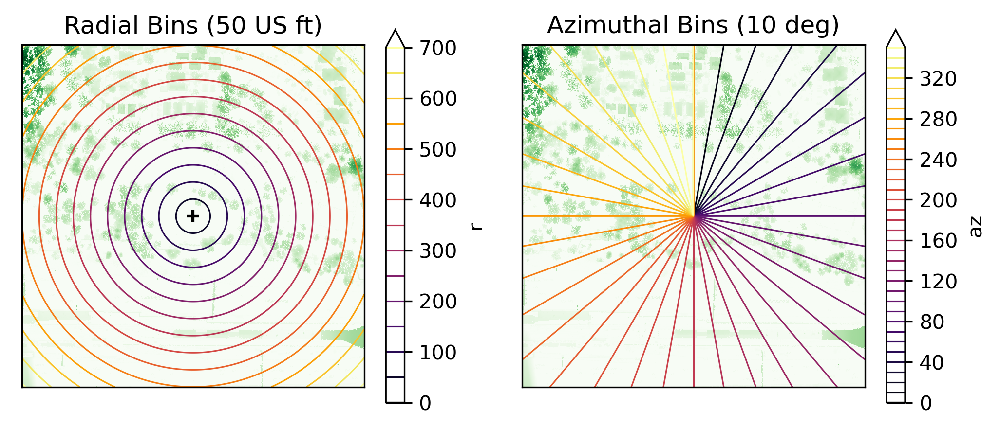

In [82]:
fig_fn = os.path.join(site_name, site_name+'_LiDAR_r_az_bins.png')
f, axa = plt.subplots(1,2, figsize=(7,3), sharex=True, sharey=True, dpi=300)
xds['CHM_3DEP'].drop('spatial_ref').plot(ax=axa[0], cmap='Greens', vmin=0, add_colorbar=False)
xds['CHM_3DEP'].drop('spatial_ref').plot(ax=axa[1], cmap='Greens', vmin=0, add_colorbar=False)
xds.coords['r'].drop('spatial_ref').plot.contour(ax=axa[0], x='x', y='y', cmap='inferno', linewidths=0.75, levels=r_bins, add_colorbar=True)
xds.coords['az'].drop('spatial_ref').plot.contour(ax=axa[1], x='x', y='y', cmap='inferno', linewidths=0.75, levels=az_bins, add_colorbar=True)
for ax in axa:
    ax.set_aspect('equal')
    ax.scatter(xds.attrs['xc'],xds.attrs['yc'], marker='+', color='k')
    hide_ticks(ax)
axa[0].set_title(f'Radial Bins ({r_binwidth} {unit})')
axa[1].set_title(f'Azimuthal Bins ({az_binwidth} deg)')
plt.tight_layout()
plt.savefig(fig_fn)

In [83]:
clim = [min(r_bin_mean.DTM_3DEP.min(), az_bin_mean.DTM_3DEP.min()), max(az_bin_mean.DSM_3DEP.max(), az_bin_mean.DSM_3DEP.max())]
chm_clim = [0, max(r_bin_mean.CHM_3DEP.max(), az_bin_mean.CHM_3DEP.max())]
pad = 0.05 * (clim[1] - clim[0])
clim[0] -= pad
clim[1] += pad
chm_clim[1] += pad

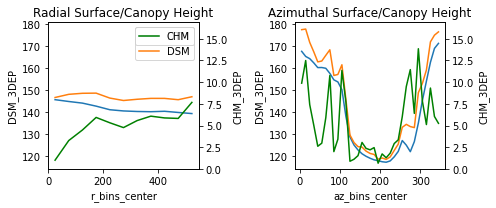

In [84]:
f, axa = plt.subplots(1,2, figsize=(7,3))
ax2 = axa[0].twinx()
ax3 = axa[1].twinx()
r_bin_mean.DTM_3DEP.drop('spatial_ref').plot(ax=axa[0], label='DTM')
r_bin_mean.DSM_3DEP.drop('spatial_ref').plot(ax=axa[0], label='DSM')
r_bin_mean.CHM_3DEP.drop('spatial_ref').plot(ax=ax2, color='green', label='CHM')
az_bin_mean.DTM_3DEP.drop('spatial_ref').plot(ax=axa[1])
az_bin_mean.DSM_3DEP.drop('spatial_ref').plot(ax=axa[1])
az_bin_mean.CHM_3DEP.drop('spatial_ref').plot(ax=ax3, color='green')
axa[0].set_ylim(*clim)
axa[1].set_ylim(*clim)
ax2.set_ylim(*chm_clim)
ax3.set_ylim(*chm_clim)
axa[0].legend()
axa[0].set_title('Radial Surface/Canopy Height')
axa[1].set_title('Azimuthal Surface/Canopy Height')
ax2.legend()
plt.tight_layout()

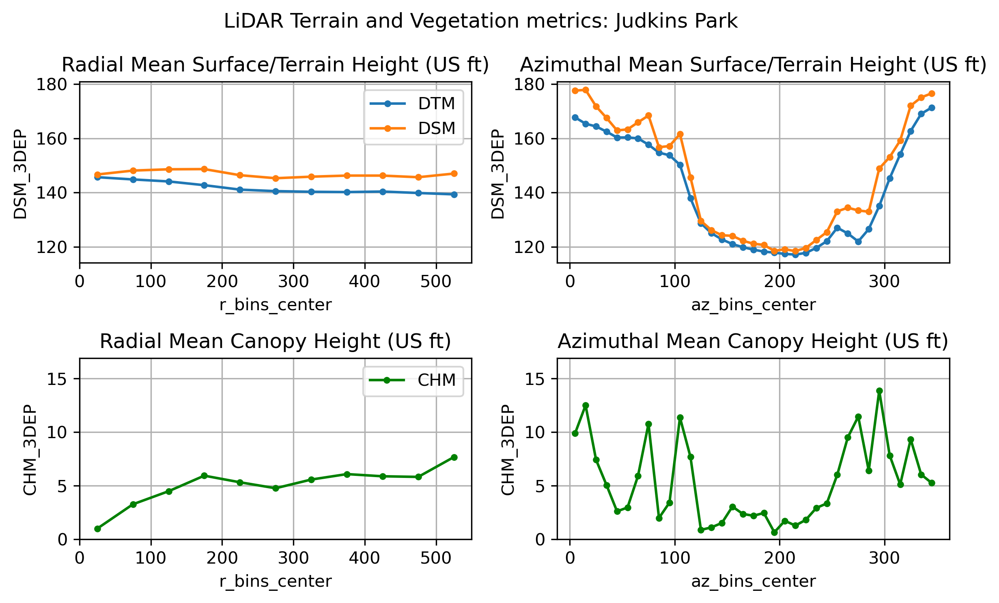

In [85]:
fig_fn = os.path.join(site_name, site_name+'_LiDAR_r_az_mean.png')
f, axa = plt.subplots(2,2, figsize=(8, 5), dpi=300)
r_bin_mean.DTM_3DEP.drop('spatial_ref').plot(ax=axa[0,0], marker='.', label='DTM')
r_bin_mean.DSM_3DEP.drop('spatial_ref').plot(ax=axa[0,0], marker='.', label='DSM')
r_bin_mean.CHM_3DEP.drop('spatial_ref').plot(ax=axa[1,0], marker='.', color='green', label='CHM')
az_bin_mean.DTM_3DEP.drop('spatial_ref').plot(ax=axa[0,1], marker='.')
az_bin_mean.DSM_3DEP.drop('spatial_ref').plot(ax=axa[0,1], marker='.')
az_bin_mean.CHM_3DEP.drop('spatial_ref').plot(ax=axa[1,1], marker='.', color='green')
axa[0,0].set_ylim(*clim)
axa[0,1].set_ylim(*clim)
axa[1,0].set_ylim(*chm_clim)
axa[1,1].set_ylim(*chm_clim)
axa[0,0].legend()
axa[0,0].set_title(f'Radial Mean Surface/Terrain Height ({unit})')
axa[0,1].set_title(f'Azimuthal Mean Surface/Terrain Height ({unit})')
axa[1,0].set_title(f'Radial Mean Canopy Height ({unit})')
axa[1,1].set_title(f'Azimuthal Mean Canopy Height ({unit})')
axa[1,0].legend()
for ax in axa.ravel():
    ax.grid()
plt.suptitle(f'LiDAR Terrain and Vegetation metrics: {site_name}')
plt.tight_layout()
plt.savefig(fig_fn)

In [120]:
#clim = (min(r_bin_norm.DTM_3DEP.min(), az_bin_norm.DTM_3DEP.min()), max(az_bin_norm.DSM_3DEP.max(), az_bin_norm.DSM_3DEP.max()))
#chm_clim = (0, max(r_bin_norm.CHM_3DEP.max(), az_bin_norm.CHM_3DEP.max()))